# SIIM - ISIC - Melanoma XG Boost

Here we are making an attempt to identify melanoma in images of skin lesions.
This model is predicting the probability (floating point) between 0.0 and 1.0 that the lesion in the image is malignant or benign.
In the training data, train.csv, the value 0 denotes benign, and 1 indicates malignant.

The files we are using are:
#1.) train.csv - the training set 
#2.) test.csv - the test set 
#3.) sample_submission.csv - a sample submission file with the name of the images and target value set as 0

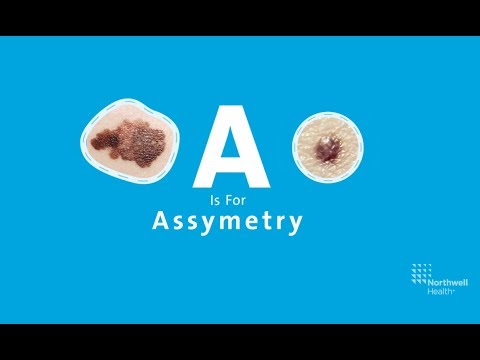

In [83]:
from IPython.display import YouTubeVideo

#Introduction video on what is Melanoma
YouTubeVideo('hXYd0WRhzN4', width=800, height=450)

In [84]:
#importing required libraries

import numpy as np
import pandas as pd
import xgboost as xgb
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as py
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [85]:
#Understanding both train and test data

train = pd.read_csv('C:/Users/Anindita/Desktop/AdvDataScience Project/train.csv')
test = pd.read_csv('C:/Users/Anindita/Desktop/AdvDataScience Project/test.csv')
train.target.value_counts()

0    32542
1      584
Name: target, dtype: int64

In [86]:
print('The size of training data : {}'.format(train.shape))
print('The size of testing data : {}'.format(test.shape))

The size of training data : (33126, 8)
The size of testing data : (10982, 5)


In [87]:
train.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
0,ISIC_2637011,IP_7279968,male,45.0,head/neck,unknown,benign,0
1,ISIC_0015719,IP_3075186,female,45.0,upper extremity,unknown,benign,0
2,ISIC_0052212,IP_2842074,female,50.0,lower extremity,nevus,benign,0
3,ISIC_0068279,IP_6890425,female,45.0,head/neck,unknown,benign,0
4,ISIC_0074268,IP_8723313,female,55.0,upper extremity,unknown,benign,0


In [88]:
a = np.mean(train.target)
print('The Distribution of Training dataset : {}'.format(a))

The Distribution of Training dataset : 0.01762965646320111


**Based on above value it is a binary classification type dataset**

In [8]:
train.describe()

,age_approx,target
count,33058.000000,33126.000000
mean,48.870016,0.017630
std,14.380360,0.131603
min,0.000000,0.000000
25%,40.000000,0.000000
50%,50.000000,0.000000
75%,60.000000,0.000000
max,90.000000,1.000000


## Checking if Patient-ID were duplicated 

In [91]:
print("The total patient ids are {}, from those the unique ids are {}".format(train['patient_id'].count(),train['patient_id'].value_counts().shape[0] ))

The total patient ids are 33126, from those the unique ids are 2056


In [92]:
benign_gender = train.groupby(['benign_malignant']).count()['sex'].to_frame()
benign_gender.head()

,sex
benign_malignant,
benign,32477
malignant,584


## Visualizing the distribution of age data in the target columns using box-plot tool of seaborn library

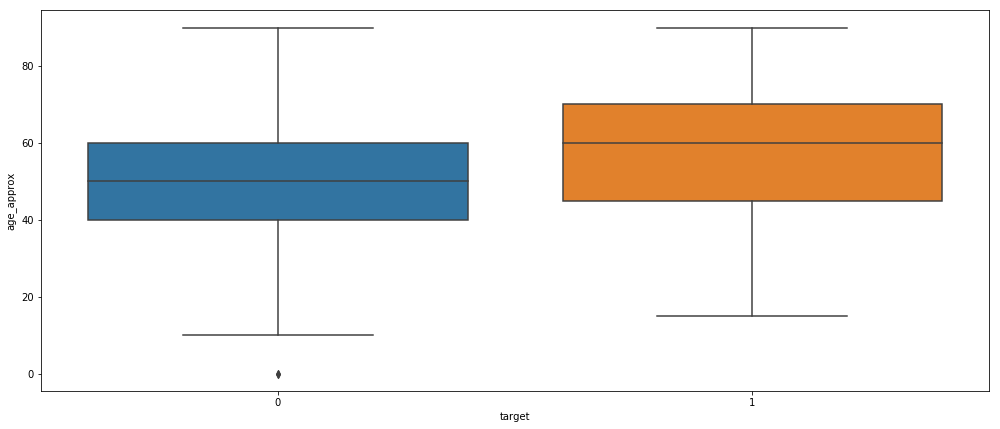

In [93]:
plt.figure(figsize = (17,7))
sns.boxplot(x = train['target'], y = train['age_approx'])

## Visualizing the target value based on the diagnosis from the training data

In [13]:
fig = px.line(train, x="target", y="diagnosis")
py.iplot(fig, filename="simple_line")

## Visualizing distribution of age_approx from both train and test data as per the target

Text(0.5, 1.0, '')

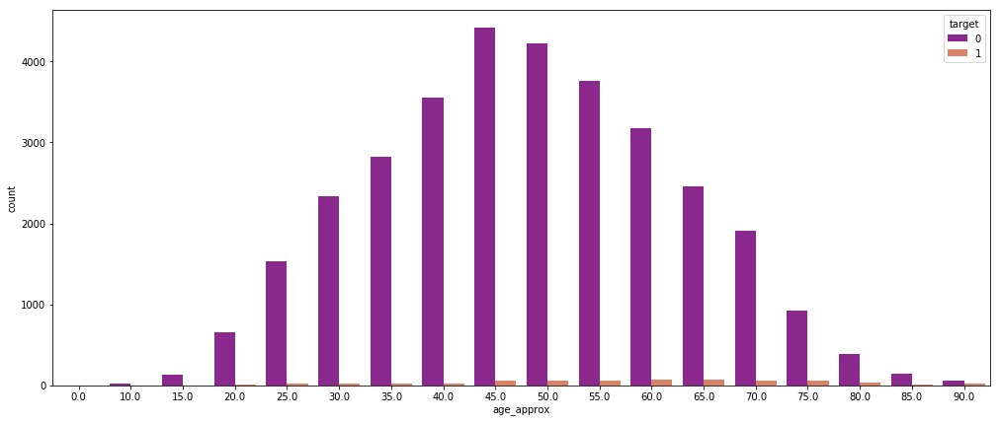

In [16]:
plt.figure(figsize = (17,7))
ax = sns.countplot(x="age_approx", hue="target", data=train, palette="plasma")
ax.set_title('', fontsize=40)

## Imputing missing values in test and train data

In [94]:
train['sex'] = train['sex'].fillna('na')
train['anatom_site_general_challenge'] = train['anatom_site_general_challenge'].fillna('na')
train['age_approx'] = train['age_approx'].fillna(0)

test['sex'] = test['sex'].fillna('na')
test['anatom_site_general_challenge'] = test['anatom_site_general_challenge'].fillna('na')
test['age_approx'] = test['age_approx'].fillna(0)

train['sex'] = train['sex'].astype("category").cat.codes +1
train['anatom_site_general_challenge'] = train['anatom_site_general_challenge'].astype("category").cat.codes +1

test['sex'] = test['sex'].astype("category").cat.codes +1
test['anatom_site_general_challenge'] = test['anatom_site_general_challenge'].astype("category").cat.codes +1

train.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
0,ISIC_2637011,IP_7279968,2,45.0,1,unknown,benign,0
1,ISIC_0015719,IP_3075186,1,45.0,7,unknown,benign,0
2,ISIC_0052212,IP_2842074,1,50.0,2,nevus,benign,0
3,ISIC_0068279,IP_6890425,1,45.0,1,unknown,benign,0
4,ISIC_0074268,IP_8723313,1,55.0,7,unknown,benign,0


In [95]:
test.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge
0,ISIC_0052060,IP_3579794,2,70.0,3
1,ISIC_0052349,IP_7782715,2,40.0,2
2,ISIC_0058510,IP_7960270,1,55.0,6
3,ISIC_0073313,IP_6375035,1,50.0,6
4,ISIC_0073502,IP_0589375,1,45.0,2


## Visualizing anatom site general challenge  

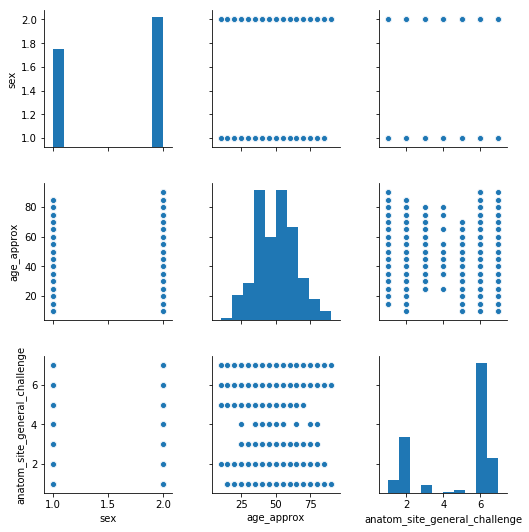

In [96]:
sns.pairplot(test[["sex", "age_approx", "anatom_site_general_challenge"]])

# Label encoding for gender and visualizing count of male/female based on the target value to decide malignant or benign from test and train data

In [134]:
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()

In [135]:
train['sex_enc'] = enc.fit_transform(train.sex.astype('str'))
test['sex_enc'] = enc.transform(test.sex.astype('str'))

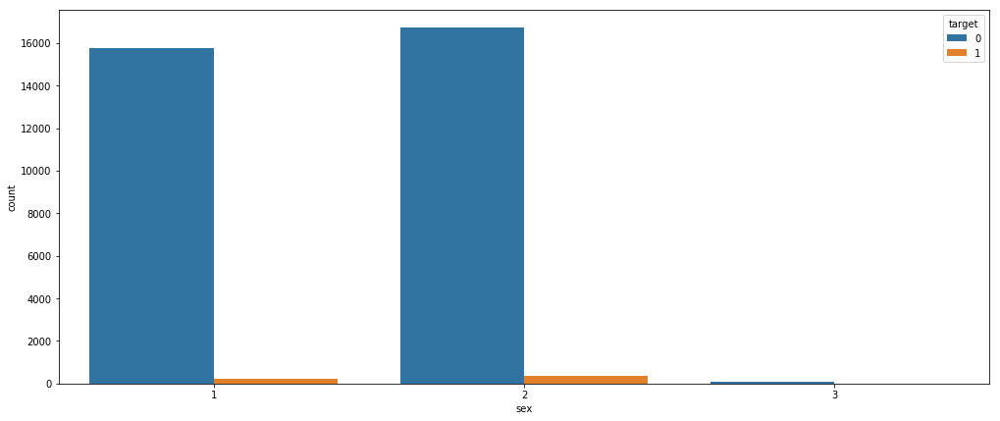

In [138]:
plt.figure(figsize = (17,7))
sns.countplot(x = 'sex', hue = 'target', data = train)
# 1 is male, 2 is female and 3 is unknown in the X axis as plotted below for the understanding
# Target: Orange color indicates Malignant and Blue color indicates Benign as per the gender

## Displaying images

In [101]:
im = train['image_name'].values
display(im)

array(['ISIC_2637011', 'ISIC_0015719', 'ISIC_0052212', ...,
       'ISIC_9999515', 'ISIC_9999666', 'ISIC_9999806'], dtype=object)

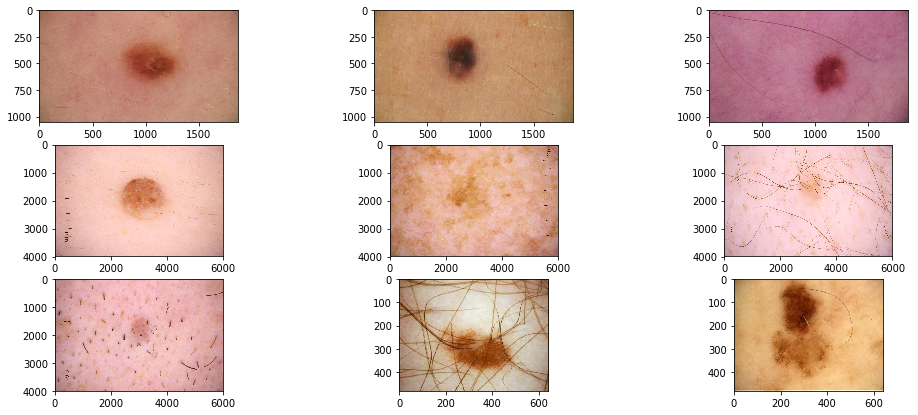

In [103]:
#to interact with the Operating System
import os

plt.figure(figsize=(17,7))

image_dir = 'C:/Users/Anindita/Desktop/AdvDataScience Project/'

img = [np.random.choice(im + '.jpg') for i in range(10)]
img_dir = image_dir + '/jpeg/train'

for i in range(9):
    plt.subplot(3,3, i+1)
    images = plt.imread(os.path.join(img_dir, img[i]))
    plt.imshow(images)

## Display Benign and Malignant images

In [104]:
malignant = train[train['benign_malignant']=='malignant']
benign = train[train['benign_malignant']=='benign']

print(malignant)
print(benign)

         image_name  patient_id  sex  age_approx  \
91     ISIC_0149568  IP_0962375    1        55.0   
235    ISIC_0188432  IP_0135517    1        50.0   
314    ISIC_0207268  IP_7735373    2        55.0   
399    ISIC_0232101  IP_8349964    2        65.0   
459    ISIC_0247330  IP_3232631    1        65.0   
475    ISIC_0250839  IP_6234053    2        75.0   
544    ISIC_0272509  IP_0408084    1        35.0   
546    ISIC_0273046  IP_3293726    2        80.0   
551    ISIC_0274382  IP_7600629    2        65.0   
558    ISIC_0275828  IP_7252102    2        30.0   
580    ISIC_0280912  IP_5831170    2        70.0   
607    ISIC_0286360  IP_7729044    2        60.0   
747    ISIC_0327406  IP_7069391    2        40.0   
758    ISIC_0333091  IP_6868151    2        25.0   
774    ISIC_0337631  IP_2041319    1        55.0   
826    ISIC_0351666  IP_1665515    2        80.0   
886    ISIC_0369831  IP_3237442    2        80.0   
1288   ISIC_0489267  IP_8171851    1        60.0   
1332   ISIC_

In [105]:
malignant.head(5)

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target,sex_enc
91,ISIC_0149568,IP_0962375,1,55.0,7,melanoma,malignant,1,0
235,ISIC_0188432,IP_0135517,1,50.0,7,melanoma,malignant,1,0
314,ISIC_0207268,IP_7735373,2,55.0,6,melanoma,malignant,1,1
399,ISIC_0232101,IP_8349964,2,65.0,6,melanoma,malignant,1,1
459,ISIC_0247330,IP_3232631,1,65.0,2,melanoma,malignant,1,0


In [106]:
benign.head(5)

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target,sex_enc
0,ISIC_2637011,IP_7279968,2,45.0,1,unknown,benign,0,1
1,ISIC_0015719,IP_3075186,1,45.0,7,unknown,benign,0,0
2,ISIC_0052212,IP_2842074,1,50.0,2,nevus,benign,0,0
3,ISIC_0068279,IP_6890425,1,45.0,1,unknown,benign,0,0
4,ISIC_0074268,IP_8723313,1,55.0,7,unknown,benign,0,0


## Malignant

Random Malignant Images are Displayed!!


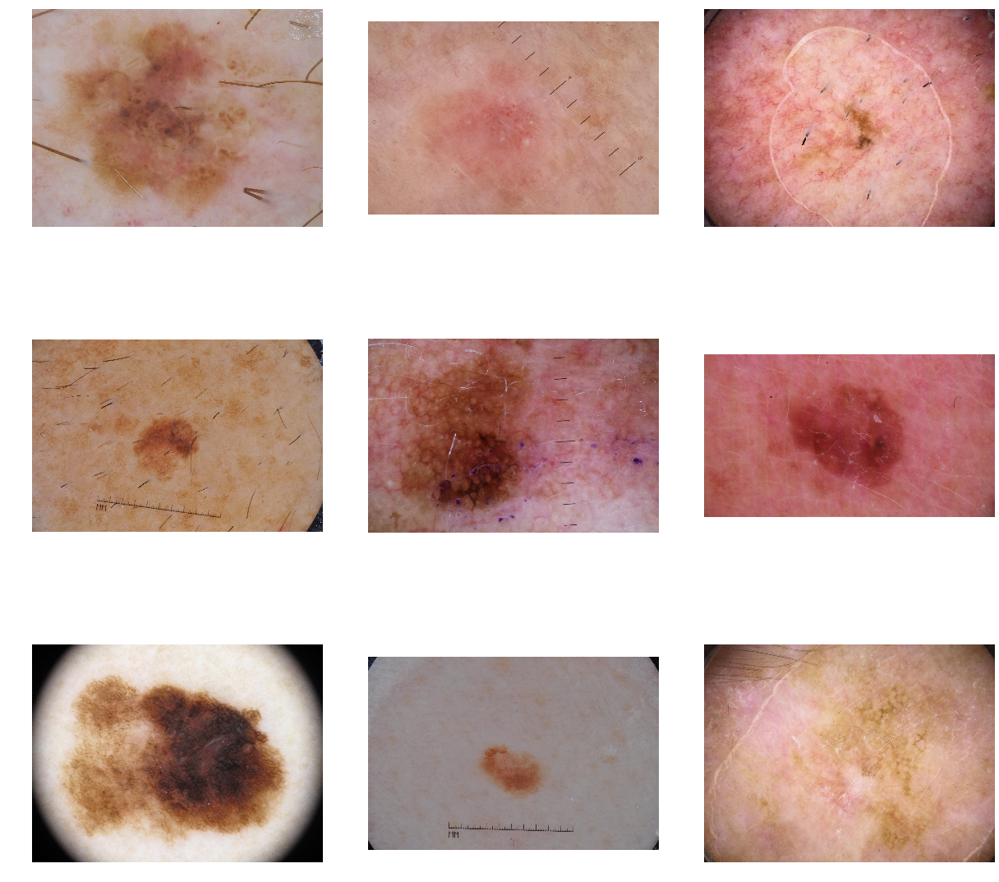

In [107]:
im_malignant = malignant['image_name'].values
image_dir = 'C:/Users/Anindita/Desktop/AdvDataScience Project/'

img = [np.random.choice(im_malignant + '.jpg') for i in range(10)]
img_dir = image_dir + '/jpeg/train'
plt.figure(figsize=(17,17))

for i in range(9):
    plt.subplot(3,3, i+1)
    images = plt.imread(os.path.join(img_dir, img[i]))
    plt.imshow(images)
    plt.axis('off')
plt.tight_layout()
print("Random Malignant Images are Displayed!!")

## Benign

Random Benign Images are displayed!!


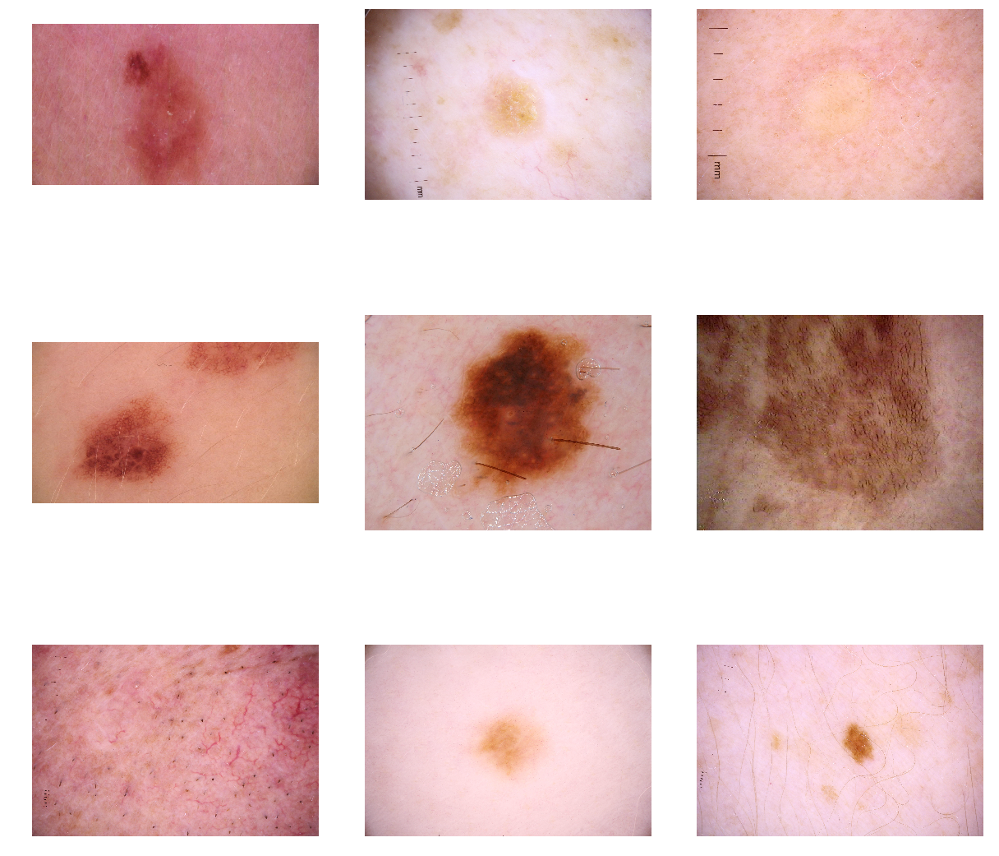

In [108]:
im_benign = benign['image_name'].values
image_dir = 'C:/Users/Anindita/Desktop/AdvDataScience Project/'

img = [np.random.choice(im_benign + '.jpg') for i in range(10)]
img_dir = image_dir + '/jpeg/train'
plt.figure(figsize=(17,17))

for i in range(9):
    plt.subplot(3,3, i+1)
    images = plt.imread(os.path.join(img_dir, img[i]))
    plt.imshow(images)
    plt.axis('off')
plt.tight_layout()
print('Random Benign Images are displayed!!')

## Let's visualize the image intensities using histogram

**Benign Images**

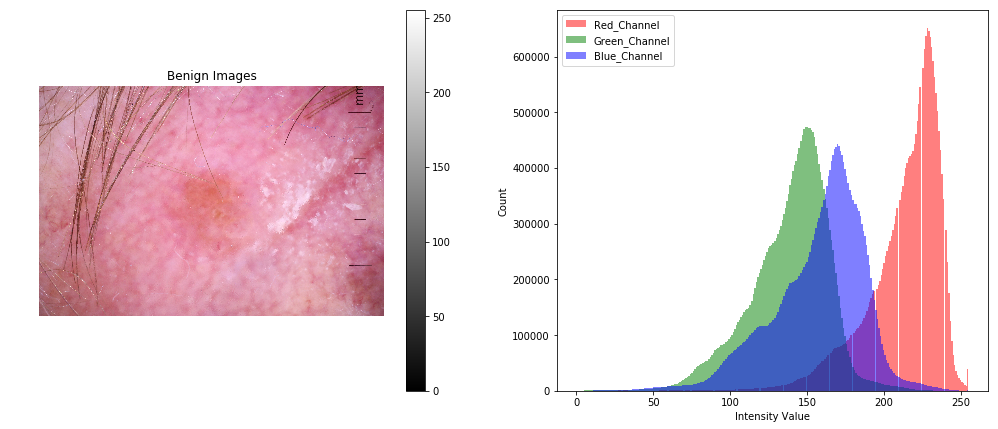

In [110]:
img = im_benign[0] + '.jpg'
f = plt.figure(figsize=(17,7))
f.add_subplot(1,2,1)

images = plt.imread(os.path.join(img_dir, img))
plt.imshow(images, cmap='gray')
plt.axis('off')
plt.colorbar()
plt.title('Benign Images')

f.add_subplot(1,2,2)
_= plt.hist(images[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
_= plt.hist(images[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
_= plt.hist(images[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
_= plt.xlabel('Intensity Value')
_= plt.ylabel('Count')
_= plt.legend(['Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()

**Malignant Images**

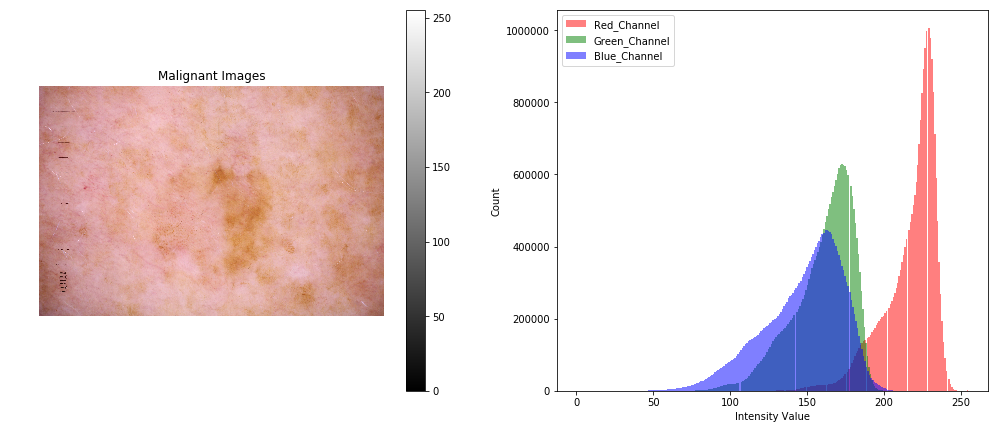

In [111]:
img = im_malignant[0] + '.jpg'
f = plt.figure(figsize=(17,7))
f.add_subplot(1,2,1)

images = plt.imread(os.path.join(img_dir, img))
plt.imshow(images, cmap='gray')
plt.axis('off')
plt.colorbar()
plt.title('Malignant Images')

f.add_subplot(1,2,2)
_= plt.hist(images[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
_= plt.hist(images[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
_= plt.hist(images[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
_= plt.xlabel('Intensity Value')
_= plt.ylabel('Count')
_= plt.legend(['Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()

## Training model and implementing XG Boost Algorithm

In [112]:
x_train = train[['sex', 'age_approx','anatom_site_general_challenge']]
y_train = train['target']

x_test = test[['sex', 'age_approx','anatom_site_general_challenge']]

train_DMatrix = xgb.DMatrix(x_train, label= y_train)
test_DMatrix = xgb.DMatrix(x_test)

In [113]:
clf = xgb.XGBClassifier(n_estimators=3000, 
                        max_depth=18, 
                        learning_rate=0.15, 
                        num_class = 2, 
                        objective='multi:softprob',
                        seed=0,  
                        nthread=-1, 
                        scale_pos_weight = (32542./584.))

clf.fit(x_train, y_train)

[20:47:34] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
       importance_type='gain', interaction_constraints='',
       learning_rate=0.15, max_delta_step=0, max_depth=18,
       min_child_weight=1, missing=nan, monotone_constraints='()',
       n_estimators=3000, n_jobs=-1, nthread=-1, num_class=2,
       num_parallel_tree=1, objective='multi:softprob', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=55.72260273972603,
       seed=0, subsample=1, tree_method='exact', validate_parameters=1,
       verbosity=None)

In [114]:
clf.predict_proba(x_test)[:,1]

sub_xgb = pd.read_csv('C:/Users/Anindita/Desktop/AdvDataScience Project/sample_submission.csv')
sub_xgb.target = clf.predict_proba(x_test)[:,1]

In [115]:
sub_xgb.head()

,image_name,target
0,ISIC_0052060,0.000899
1,ISIC_0052349,0.008138
2,ISIC_0058510,0.014585
3,ISIC_0073313,0.008273
4,ISIC_0073502,0.007269


In [116]:
print(sub_xgb.target.min())
print(sub_xgb.target.max())

7.044029e-06
0.74949193


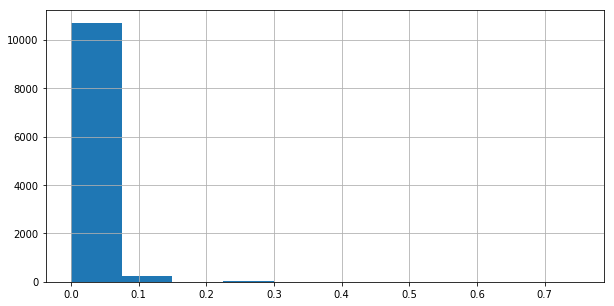

In [117]:
plt.figure(figsize = (10,5))
sub_xgb.target.hist()

In [139]:
#Importing the predicted target values in a CSV file using XG Boost algorithm for all the images

sub_xgb.to_csv('Predicted_submission.csv', index = False)

## References

https://www.kaggle.com/redwankarimsony/power-of-metadata-xgboost-cnn-ensemble/comments